<a href="https://colab.research.google.com/github/DOmarmunoz/Vicsek-Model-Original-y-Modificado/blob/main/TFG_ETE51.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Sistema de partículas autopropulsadas con condiciones periódicas de contorno
Empezar por programar un sistema de $N$ partículas con $v_0$ constante y cuyos ángulos no se actualicen.
Implementar periodic boundary conditions y plotear

# Modelo de Vicsek
- Código de Francesco Turci: https://francescoturci.net/2020/06/19/minimal-vicsek-model-in-python/


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from IPython.display import clear_output, display
import time
import matplotlib.cm as cm
from matplotlib.animation import FuncAnimation
import pandas as pd
import numba

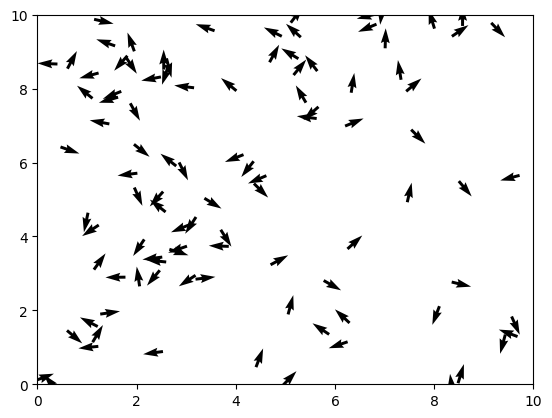

In [ ]:
# Parámetros
num_circles = 100  # Número de particulas
v0 = 1.0
dt = 1
total_time = 200
radius = 0.2  # Radio de las particulas
x_lim = 10
y_lim = 10
R = 1
noise_amplitude = 0.7




# Posiciones iniciales aleatorias

x = np.random.rand(num_circles) * x_lim
y = np.random.rand(num_circles) * y_lim
theta = np.random.uniform(0, 2*np.pi, num_circles)   # Ángulos aleatorios

# Crear la figura y los ejes
fig, ax = plt.subplots()
ax.set_xlim([0, x_lim])
ax.set_ylim([0, y_lim])

# Crear las puntas de flecha iniciales
velocidades = np.random.uniform(0, 20, num_circles)
Q = ax.quiver(x, y, np.cos(theta), np.sin(theta),
              pivot='mid', color='black', units='inches', scale=5)

data_to_save =[]

k = 0


# Función de animación
def animate(k):
    global x, y, theta

    # Modifico la orientación de las theta, cuando una particula se acerca a ella, siempre que este dentro del radio R de la particula
    for i in range(num_circles):
      number_of_neighbours = 0

      orientation_x = np.cos(theta[i])
      orientation_y = np.sin(theta[i])

      for j in range(num_circles):
        #VEctor que me calcule las distancias
        #La función que me orden los vectores
        #Coger los cinco primeros
        if i != j:
          if np.sqrt((x[i] - x[j])**2 + (y[i] - y[j])**2) < R:
            orientation_x += np.cos(theta[j])
            orientation_y += np.sin(theta[j])



      theta[i] = np.arctan2(orientation_y,orientation_x) + noise_amplitude * np.random.uniform(-np.pi, np.pi)


    # Calcular las nuevas posiciones
    x_dot = v0 * np.cos(theta)
    y_dot = v0 * np.sin(theta)
    x += x_dot * dt
    y += y_dot * dt
    if k % 10 == 0:
      for i in range(num_circles):
        data_to_save.append([k, i, theta[i],x[i],y[i]])


    #k += 1

    # Mantener las particulas dentro de la pantalla (condiciones de contorno periódicas)
    x = np.where(x > x_lim, x - x_lim, x)
    x = np.where(x < 0, x + x_lim, x)
    y = np.where(y > y_lim, y - y_lim, y)
    y = np.where(y < 0, y + y_lim, y)



    # Actualizar las posiciones, direcciones y colores de las puntas de flecha
    Q.set_offsets(np.column_stack([x, y]))
    Q.set_UVC(np.cos(theta), np.sin(theta))

    return [Q]

# Crear la animación
ani = FuncAnimation(fig, animate, frames=int(total_time / dt), interval=dt * 1000, blit=False)

from IPython.display import HTML
HTML(ani.to_jshtml())



##Función de Vicsek - Aqui no esta la simulación

In [ ]:
'''
Este Script hace la simulación, pero solo lo hace a nivel datos, no crea la animación
como en el caso anterior. Esto se hace así para optimizar el tiempo de ejecución.

'''

def automatización(noise):
  # Parámetros
  num_circles = 100  # Número de particulas
  v0 = 1.0
  dt = 1
  total_time = 5000
  radius = 0.2  # Radio de las particulas
  x_lim = 10
  y_lim = 10
  R = 1

  # Posiciones iniciales aleatorias

  x = np.random.rand(num_circles) * x_lim
  y = np.random.rand(num_circles) * y_lim
  theta = np.random.uniform(0, 2*np.pi, num_circles)   # Ángulos aleatorios


  #Amplitud del ruido
  noise_amplitude = noise

  # Crear la figura y los ejes
  fig, ax = plt.subplots()
  ax.set_xlim([0, x_lim])
  ax.set_ylim([0, y_lim])

  # Crear las puntas de flecha iniciales
  velocidades = np.random.uniform(0, 20, num_circles)
  Q = ax.quiver(x, y, np.cos(theta), np.sin(theta),
                pivot='mid', color='blue', units='inches', scale=5)

  data_to_save =[]

  k = 0


  # Función de animación
  def not_animate (k,x,y, theta):

      # Modifico la orientación de las theta, cuando una particula se acerca a ella, siempre que este dentro del radio R de la particula
      for i in range(num_circles):
        number_of_neighbours = 0

        orientation_x = np.cos(theta[i])
        orientation_y = np.sin(theta[i])

        for j in range(num_circles):
          if i != j:
            if np.sqrt((x[i] - x[j])**2 + (y[i] - y[j])**2) < R:
              orientation_x += np.cos(theta[j])
              orientation_y += np.sin(theta[j])



        theta[i] = np.arctan2(orientation_y,orientation_x) + noise_amplitude * np.random.uniform(-np.pi, np.pi)


      # Calcular las nuevas posiciones
      x_dot = v0 * np.cos(theta)
      y_dot = v0 * np.sin(theta)
      x += x_dot * dt
      y += y_dot * dt


      if k % 10 == 0:
        for i in range(num_circles):
          data_to_save.append([k, i, theta[i],x[i],y[i]])


      #k += 1

      # Mantener las particulas dentro de la pantalla (condiciones de contorno periódicas)
      x = np.where(x > x_lim, x - x_lim, x)
      x = np.where(x < 0, x + x_lim, x)
      y = np.where(y > y_lim, y - y_lim, y)
      y = np.where(y < 0, y + y_lim, y)




      return x,y,theta


  # Bucle principal
  for k in range(int(total_time / dt)):
      x,y,theta = not_animate(k,x,y,theta)
  return data_to_save


0.0


KeyboardInterrupt: 

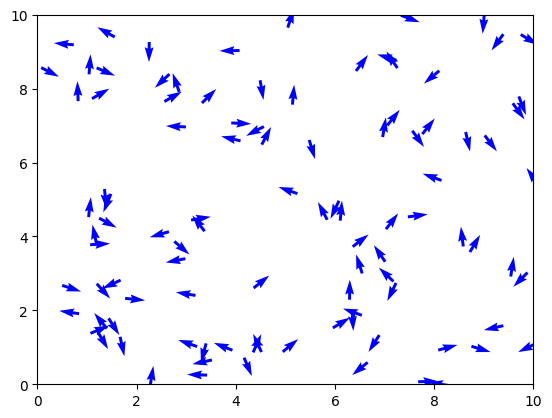

In [ ]:
ruido = np.arange(0, 1.05, 0.05)
resultados = []
for noise in ruido:
  print(noise)
  data_to_save = automatización(noise)
  for fila in data_to_save:
      fila.insert(0, noise)
  resultados.extend(data_to_save)
df = pd.DataFrame(resultados, columns=['noise', 'frame', 'particle_id', 'theta', 'x', 'y'])

In [ ]:
print(df[(df['noise']== 0.2) & (df['particle_id']==99)])

In [ ]:
#df = pd.DataFrame(data_to_save, columns=['frame', 'particle_id', 'theta','x','y'])
#df.to_csv('toda_la_simulacion.csv', index=False)

In [ ]:
df = pd.read_csv('toda_la_simulacion.csv')

In [ ]:
df = df.sort_values(by=['frame', 'particle_id'])

In [ ]:
print(df[(df['noise']== 0.35) & (df['particle_id']==99)])

        noise  frame  particle_id     theta         x          y
350099   0.35      0           99 -0.920278  5.506371   5.565876
350199   0.35     10           99  0.652816  2.729477   8.492255
350299   0.35     20           99  1.347817  9.765495   2.395978
350399   0.35     30           99  1.356856  2.293469  10.278380
350499   0.35     40           99 -0.106870  5.919866   0.625443
...       ...    ...          ...       ...       ...        ...
399599   0.35   4950           99 -3.194871 -0.470631   3.549657
399699   0.35   4960           99  1.360607  3.126566   6.305174
399799   0.35   4970           99 -2.176014  4.850966   4.847781
399899   0.35   4980           99  2.587047  3.565615   2.005645
399999   0.35   4990           99  1.360185  0.457625  10.477801

[500 rows x 6 columns]


In [ ]:
ruido = df['noise'].unique()

In [ ]:
ruido

array([0.  , 0.05, 0.1 , 0.15, 0.2 , 0.25, 0.3 , 0.35, 0.4 , 0.45, 0.5 ,
       0.55, 0.6 , 0.65, 0.7 , 0.75, 0.8 , 0.85, 0.9 , 0.95, 1.  ])

##Función para calcular el parametro de orden

In [ ]:
def calculate_order_parameter(df):

    order_parameters = []
    for frame, group in df.groupby('frame'):
        theta_values = group['theta'].values
        order_parameter = np.abs(np.mean(np.exp(1j * theta_values)))
        order_parameters.append([frame, order_parameter])

    return pd.DataFrame(order_parameters, columns=['frame', 'order_parameter'])

##Bucle con diferentes noises, para calcular aquellas variables que necesito para los diferentes noises

In [ ]:

ruido = df['noise'].unique()
x_lim = 10
resultados_order_parameter = []

for noise in ruido:
    # Filtrar el DataFrame por el nivel de ruido actual
    df_aux = df[df['noise'] == noise]
    df_noise = df_aux[df_aux['frame'] >= 4000]
    # Calcular el parámetro de orden para este nivel de ruido
    order_parameter_df = calculate_order_parameter(df_noise)
    order_parameter_df['order_parameter_al_cuadrado'] = order_parameter_df['order_parameter'] **2
    order_parameter_df['order_parameter_a_la_cuarta'] = order_parameter_df['order_parameter'] **4
    promedio_order_parameter = order_parameter_df['order_parameter'].mean()
    promedio_al_cuadrado_order_parameter = order_parameter_df['order_parameter_al_cuadrado'].mean()
    promedio_a_la_cuarta_order_parameter = order_parameter_df['order_parameter_a_la_cuarta'].mean()
    varianza = x_lim * x_lim * (promedio_al_cuadrado_order_parameter - promedio_order_parameter**2)
    binder = (1 - (promedio_a_la_cuarta_order_parameter)/(3*(promedio_al_cuadrado_order_parameter**2)))
    # Agregar los resultados a la lista
    resultados_order_parameter.append([noise, promedio_order_parameter,varianza,binder])

# Crear el DataFrame final
df_order_parameter = pd.DataFrame(resultados_order_parameter, columns=['noise', 'order_parameter','varianza','Binder'])

##Gráfica del Parametro de order y Noise

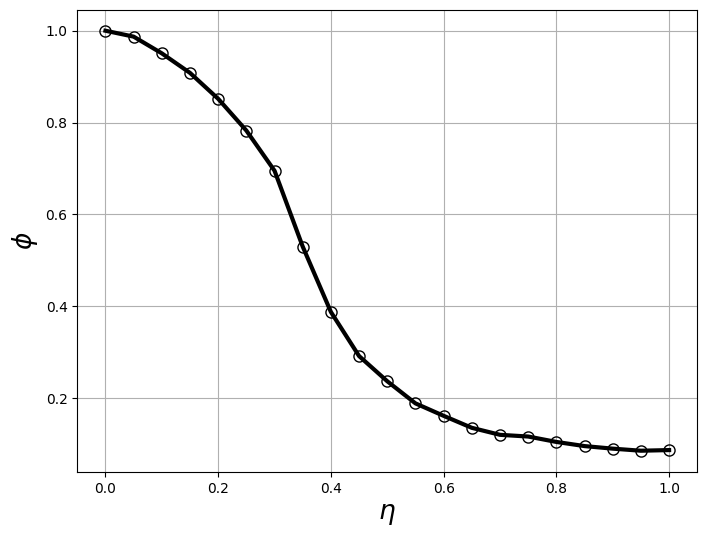

In [ ]:
plt.figure(figsize=(8, 6))
# Crear la gráfica
plt.plot(df_order_parameter['noise'], df_order_parameter['order_parameter'],marker='o',markersize =8, linestyle='-',linewidth = 3,markerfacecolor='none', markeredgecolor='black',color='black')

# Añadir etiquetas y título
plt.xlabel('$\eta$', fontsize = 19)
plt.ylabel('$\phi$', fontsize = 19)
#plt.title('Relación entre Ruido y Parámetro de Orden')

# Mostrar la gráfica
plt.grid(True)
plt.show()

##Gráfica entre la Varianza y el noise

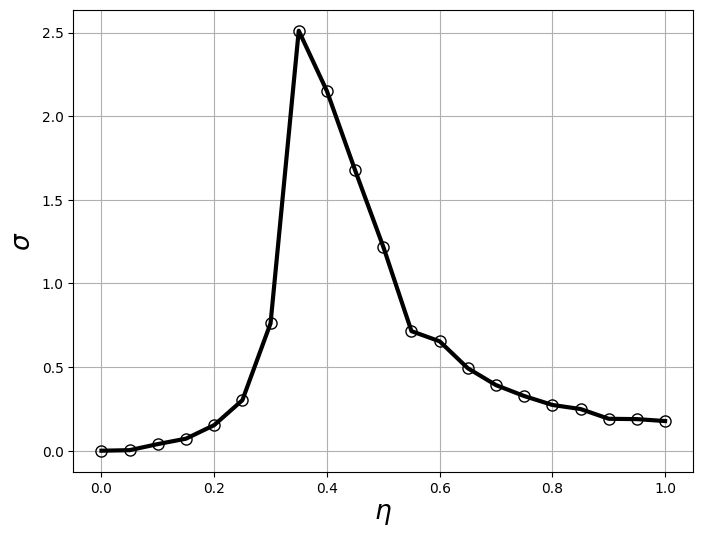

In [ ]:
plt.figure(figsize=(8, 6))
# Crear la gráfica
plt.plot(df_order_parameter['noise'], df_order_parameter['varianza'],marker='o', markersize =8, linestyle='-',linewidth = 3,markerfacecolor='none', markeredgecolor='black',color='black')

# Añadir etiquetas y título
plt.xlabel('$\eta$',fontsize = 19)
plt.ylabel('$\sigma$', fontsize =19)
#plt.title('Relación entre Ruido y Parámetro de Orden')

# Mostrar la gráfica
plt.grid(True)
plt.show()

##Gráfica entre Blinder cumulant y el noise

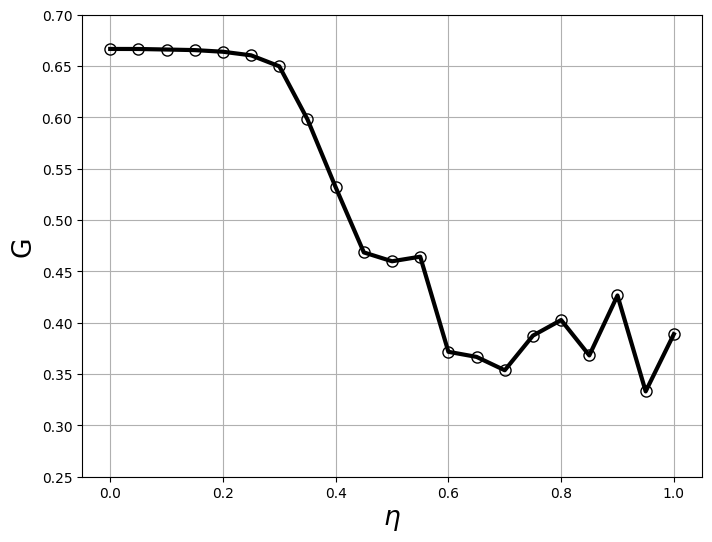

In [ ]:
plt.figure(figsize=(8, 6))
# Crear la gráfica
plt.plot(df_order_parameter['noise'], df_order_parameter['Binder'],marker='o',markersize = 8, linestyle='-',linewidth =3 ,markerfacecolor='none', markeredgecolor='black',color='black')

# Añadir etiquetas y título
plt.xlabel('$\eta$', fontsize = 19)
plt.ylabel('G', fontsize = 19)
#plt.title('Relación entre Ruido y Binder')

# Mostrar la gráfica
plt.grid(True)
x_lim = 0.7
#plt.xlim(0,x_lim)
plt.ylim(0.25,0.7)
plt.show()

In [ ]:
# Parámetros
num_circles = 50  # Número de particulas
v0 = 1.0
dt = 1
total_time = 150
radius = 0.2  # Radio de las particulas
x_lim = 10
y_lim = 10
R = 1
scaling_factor = 1
noise_amplitude = 0.2
sum_theta = 0



# Posiciones iniciales aleatorias

x = np.random.rand(num_circles) * x_lim
y = np.random.rand(num_circles) * y_lim
theta = np.random.uniform(0, 2*np.pi, num_circles)   # Ángulos aleatorios

# Crear la figura y los ejes
fig, ax = plt.subplots()
ax.set_xlim([0, x_lim])
ax.set_ylim([0, y_lim])

# Crear las puntas de flecha iniciales
velocidades = np.random.uniform(0, 20, num_circles)
Q = ax.quiver(x, y, np.cos(theta), np.sin(theta),
              pivot='mid', color='blue', units='inches', scale=5)


# Función de animación
def animate(i):
    global x, y, theta

    # Modifico la orientación de las theta, cuando una particula se acerca a ella, siempre que este dentro del radio R de la particula
    for i in range(num_circles):
      number_of_neighbours = 0

      orientation_x = np.cos(theta[i])
      orientation_y = np.sin(theta[i])

      for j in range(num_circles):
        if i != j:
          if np.sqrt((x[i] - x[j])**2 + (y[i] - y[j])**2) < R:
            orientation_x += np.cos(theta[j])
            orientation_y += np.sin(theta[j])
            #number_of_neighbours += 1


      theta[i] = np.arctan2(orientation_y,orientation_x) + noise_amplitude * np.random.uniform(-np.pi, np.pi)


    # Calcular las nuevas posiciones
    x_dot = v0 * np.cos(theta)
    y_dot = v0 * np.sin(theta)
    x += x_dot * dt
    y += y_dot * dt


    # Mantener las particulas dentro de la pantalla (condiciones de contorno periódicas)
    x = np.where(x > x_lim, x - x_lim, x)
    x = np.where(x < 0, x + x_lim, x)
    y = np.where(y > y_lim, y - y_lim, y)
    y = np.where(y < 0, y + y_lim, y)

    # Actualizar las posiciones, direcciones y colores de las puntas de flecha
    Q.set_offsets(np.column_stack([x, y]))
    Q.set_UVC(np.cos(theta), np.sin(theta))

    return [Q]

# Crear la animación
ani = FuncAnimation(fig, animate, frames=int(total_time / dt), interval=dt * 1000, blit=False)

from IPython.display import HTML
HTML(ani.to_jshtml())

#Modelo de Vicsek Topológico  
Aqui recogere parte del código que he usado en el modelo escalar, y le añadire varias lineas mas el cual tenga en cuenta la parte de los vecinos.
Las cosas que debemos de tener en cuenta al hacer este modelo, es que lo vecinos no son los que estan dentro de un radio R, si no, que se tienen en cuenta un numero n de vecinos, es decir, solo aquellos 3,4,5 o 6 vecinos mas cercanos calcularé la media de sus thetas, a primera instancia propuse

KeyboardInterrupt: 

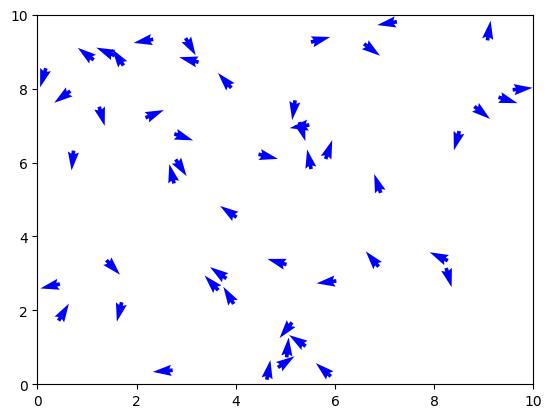

In [ ]:
import numba

# Parámetros
num_circles = 50 # Número de particulas
v0 = 1.0
dt = 1
total_time = 50
radius = 0.2  # Radio de las particulas
x_lim = 10
y_lim = 10
R = 1
noise_amplitude = 0.7
neighbours = 2
# hacer 4 y 6 vecinos solo





# Posiciones iniciales aleatorias

x = np.random.rand(num_circles) * x_lim
y = np.random.rand(num_circles) * y_lim
theta = np.random.uniform(0, 2*np.pi, num_circles)   # Ángulos aleatorios

# Crear la figura y los ejes
fig, ax = plt.subplots()
ax.set_xlim([0, x_lim])
ax.set_ylim([0, y_lim])

# Crear las puntas de flecha iniciales
velocidades = np.random.uniform(0, 20, num_circles)
Q = ax.quiver(x, y, np.cos(theta), np.sin(theta),
              pivot='mid', color='blue', units='inches', scale=5)

data_to_save =[]

k = 0


#Función que calcule las distancias entre dos puntos
@numba.jit
def distancias(x1, y1, x2, y2):
  if x1 == x2 and y1 == y2:
    return 0
  else:
    return np.sqrt((x1 - x2)**2 + (y1 - y2)**2)


# Función de animación
def animate(k):
    global x, y, theta

    # Modifico la orientación de las theta, cuando una particula se acerca a ella, siempre que este dentro del radio R de la particula
    for i in range(num_circles):
      number_of_neighbours = 0

      orientation_x = np.cos(theta[i])
      orientation_y = np.sin(theta[i])

      # Vector vacio que me calcule las distancias
      '''
      #modificar esto de dataframe a numpy
      '''

      dist = pd.DataFrame(columns=['j', 'distancia'])
      for j in range(num_circles):
        if i != j:
        #Vector que me calcule las distancias
          dist.loc[j] = [j,distancias(x[i],y[i],x[j],y[j])]
          #La función que me orden los vectores
          dist_order = dist.sort_values(by='distancia', ascending=True)
          #dist_order = dist_order.reset_index(drop=True)
          #Coger los n neightbor que quiera
          n_neightbords = dist_order.head(neighbours).copy()
      n_neightbords['j']=n_neightbords['j'].astype(int)
      #print(n_neightbords)
      for l in n_neightbords['j']:
        orientation_x += np.cos(theta[l])
        orientation_y += np.sin(theta[l])


      #Calculo las nuevas posiciones
      theta[i] = np.arctan2(orientation_y,orientation_x) + noise_amplitude * np.random.uniform(-np.pi, np.pi)


    # Calcular las nuevas posiciones
    x_dot = v0 * np.cos(theta)
    y_dot = v0 * np.sin(theta)
    x += x_dot * dt
    y += y_dot * dt
    if k % 10 == 0:
      for i in range(num_circles):
        data_to_save.append([k, i, theta[i],x[i],y[i]])


    #k += 1

    # Mantener las particulas dentro de la pantalla (condiciones de contorno periódicas)
    x = np.where(x > x_lim, x - x_lim, x)
    x = np.where(x < 0, x + x_lim, x)
    y = np.where(y > y_lim, y - y_lim, y)
    y = np.where(y < 0, y + y_lim, y)



    # Actualizar las posiciones, direcciones y colores de las puntas de flecha
    Q.set_offsets(np.column_stack([x, y]))
    Q.set_UVC(np.cos(theta), np.sin(theta))

    return [Q]

# Crear la animación
ani = FuncAnimation(fig, animate, frames=int(total_time / dt), interval=dt * 1000, blit=False)

from IPython.display import HTML
HTML(ani.to_jshtml())



##Función de Vicsek Topologico - Aquí no esta la simulación


In [ ]:
'''
Este Script hace la simulación, pero solo lo hace a nivel datos, no crea la animación
como en el caso anterior. Esto se hace así para optimizar el tiempo de ejecución.

'''

def automatiacion_topo(noise):
  # Parámetros
  num_circles = 100  # Número de particulas
  v0 = 1.0
  dt = 1
  total_time = 5000
  radius = 0.2  # Radio de las particulas
  x_lim = 10
  y_lim = 10
  R = 1
  n_min_values = 6 #(neighbours)
  print(n_min_values)


  # Posiciones iniciales aleatorias

  x = np.random.rand(num_circles) * x_lim
  y = np.random.rand(num_circles) * y_lim
  theta = np.random.uniform(0, 2*np.pi, num_circles)   # Ángulos aleatorios

  noise_amplitude = noise

  # Crear la figura y los ejes
  fig, ax = plt.subplots()
  ax.set_xlim([0, x_lim])
  ax.set_ylim([0, y_lim])

  # Crear las puntas de flecha iniciales
  velocidades = np.random.uniform(0, 20, num_circles)
  Q = ax.quiver(x, y, np.cos(theta), np.sin(theta),
                pivot='mid', color='blue', units='inches', scale=5)

  data_to_save =[]

  k = 0


  #Función que calcule las distancias entre dos puntos
  @numba.jit
  def distancias(x1, y1, x2, y2):
      if x1 == x2 and y1 == y2:
        return 0
      else:
        return np.sqrt((x1 - x2)**2 + (y1 - y2)**2)

  @numba.jit
  def distance_pbc(xi,yi,xj,yj,Lx,Ly):
      '''Calculate distance using PBC'''
      xr = xi - xj
      xr -= Lx*np.rint(xr/Lx)
      yr = yi - yj
      yr -= Ly*np.rint(yr/Ly)
      return np.sqrt(xr**2 + yr**2)


  # Función de animación
  def not_animate(k,x,y,theta):

      # Modifico la orientación de las theta, cuando una particula se acerca a ella, siempre que este dentro del radio R de la particula
      for i in range(num_circles):
        number_of_neighbours = 0

        orientation_x = np.cos(theta[i])
        orientation_y = np.sin(theta[i])

        # Vector vacio que me calcule las distancias
        #dist = pd.DataFrame(columns=['j', 'distancia'])
        dist=[]
        for j in range(num_circles):
          if i != j:
          #Vector que me calcule las distancias
            #dist.loc[j] = [j,distancias(x[i],y[i],x[j],y[j])]
            #La función que me orden los vectores
            #dist_order = dist.sort_values(by='distancia', ascending=True)
            #dist_order = dist_order.reset_index(drop=True)
            #Coger los n neightbor que quiera
            #n_neightbords = dist_order.head(neighbours).copy()
            dist.append(distance_pbc(x[i],y[i],x[j],y[j],x_lim,y_lim))
          else:
            dist.append(x_lim*y_lim)

        indices_vecinos=sorted(range(len(dist)), key=lambda k: dist[k])[:n_min_values]

        #n_neightbords['j']=n_neightbords['j'].astype(int)
        #print(n_neightbords)
        for l in indices_vecinos :#n_neightbords['j']:
          orientation_x += np.cos(theta[l])
          orientation_y += np.sin(theta[l])


        #Calculo las nuevas posiciones
        theta[i] = np.arctan2(orientation_y,orientation_x) + noise_amplitude * np.random.uniform(-np.pi, np.pi)


      # Calcular las nuevas posiciones
      x_dot = v0 * np.cos(theta)
      y_dot = v0 * np.sin(theta)
      x += x_dot * dt
      y += y_dot * dt
      if k % 10 == 0:
        for i in range(num_circles):
          data_to_save.append([k, i, theta[i],x[i],y[i]])


      #k += 1

      # Mantener las particulas dentro de la pantalla (condiciones de contorno periódicas)
      x = np.where(x > x_lim, x - x_lim, x)
      x = np.where(x < 0, x + x_lim, x)
      y = np.where(y > y_lim, y - y_lim, y)
      y = np.where(y < 0, y + y_lim, y)

      return x,y,theta

  # Bucle principal
  for k in range(int(total_time / dt)):
      x,y,theta = not_animate(k,x,y,theta)
  return data_to_save


In [ ]:

import numpy as np
import numba

@numba.jit
def distance_pbc(xi,yi,xj,yj,Lx,Ly):
    '''Calculate distance using PBC'''
    xr = xi - xj
    xr -= Lx*np.rint(xr/Lx)
    yr = yi - yj
    yr -= Ly*np.rint(yr/Ly)
    return np.sqrt(xr**2 + yr**2)

Lx,Ly=10,10
N=10
n_min_values = 6

x=np.random.rand(N)*Lx
y=np.random.rand(N)*Ly

for i in range(N):
  dist=[]
  for j in range(N):
    if i!=j:
      dist.append(distance_pbc(x[i],y[i],x[j],y[j],Lx,Ly))
    else:
      dist.append(Lx*Ly)
  indices=sorted(range(len(dist)), key=lambda k: dist[k])[:n_min_values]
  print(indices,dist)

[4, 5, 8, 6, 7, 2] [100, 5.510009729977497, 4.379293991276898, 5.738522199932918, 3.5568568475892874, 4.1575255485896525, 4.271837180051563, 4.369041392266979, 4.163397253863862, 5.779023172526032]
[6, 3, 9, 4, 5, 7] [5.510009729977497, 100, 5.0873265483047865, 3.5625882342651014, 4.17842817088706, 4.338653697421668, 1.9050192925574214, 4.748457622439297, 5.21417651377197, 3.718697762640073]
[3, 9, 5, 0, 7, 4] [4.379293991276898, 5.0873265483047865, 100, 1.5325093467191435, 4.715400833582232, 2.86649285497658, 5.61017763393078, 4.593405815762846, 4.9412236720374345, 2.560710056283288]
[2, 9, 5, 1, 7, 4] [5.738522199932918, 3.5625882342651014, 1.5325093467191435, 100, 4.039416801014417, 3.2181236868564307, 4.148112299399937, 3.886392007997979, 4.68961508664987, 1.6904233305517682]
[8, 0, 7, 3, 6, 1] [3.5568568475892874, 4.17842817088706, 4.715400833582232, 4.039416801014417, 100, 6.749707151237612, 4.1115730867192894, 3.9867998023560443, 3.3421676053508342, 5.547246933190318]
[9, 7, 2, 

In [ ]:
n_min_values

6

0.0
6
0.05
6
0.1
6
0.15000000000000002
6
0.2
6
0.25
6
0.30000000000000004
6
0.35000000000000003
6
0.4
6
0.45
6
0.5
6
0.55
6
0.6000000000000001
6
0.65
6
0.7000000000000001
6
0.75
6
0.8
6
0.8500000000000001
6
0.9
6
0.9500000000000001
6
1.0
6


<ipython-input-127-1361999922>:30: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots()


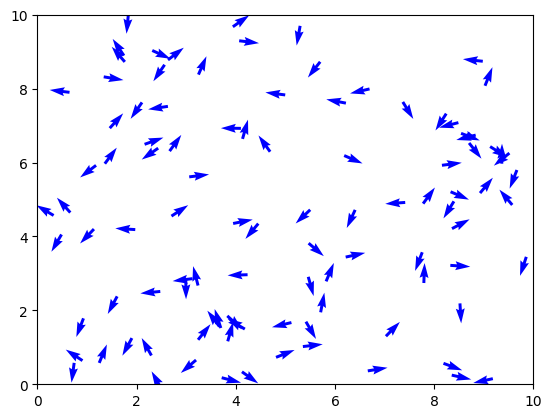

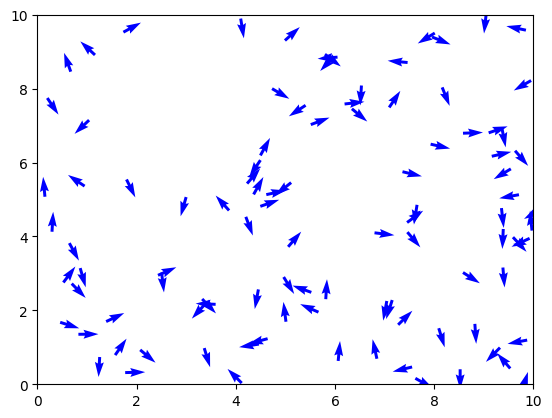

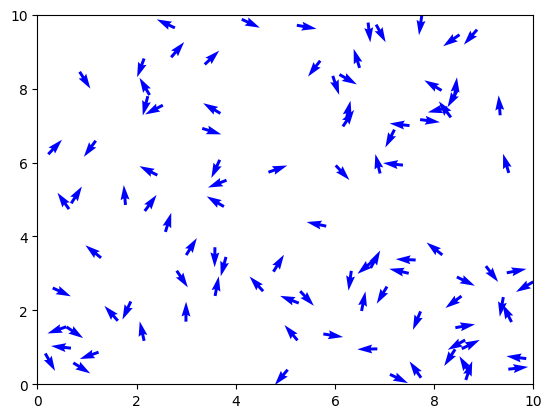

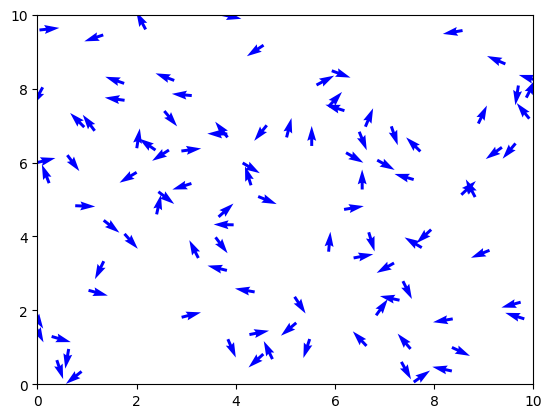

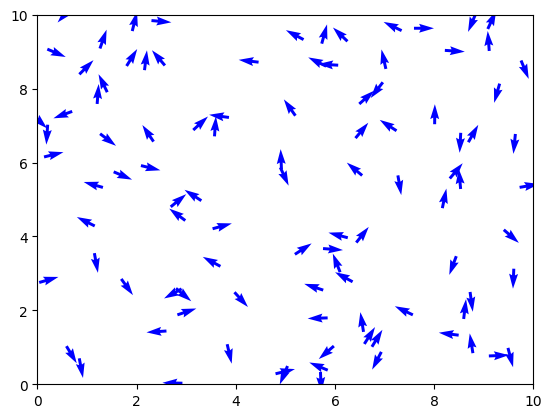

...

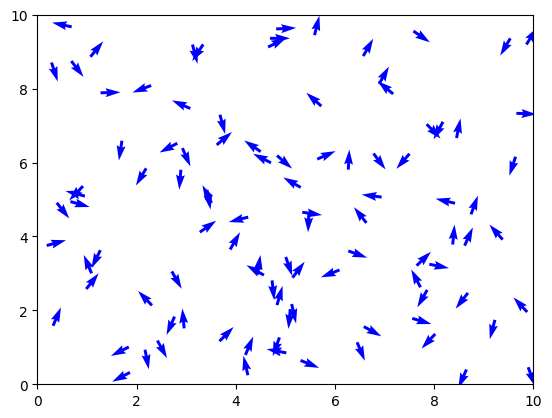

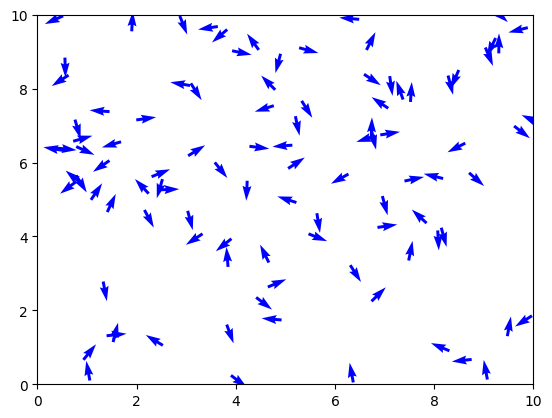

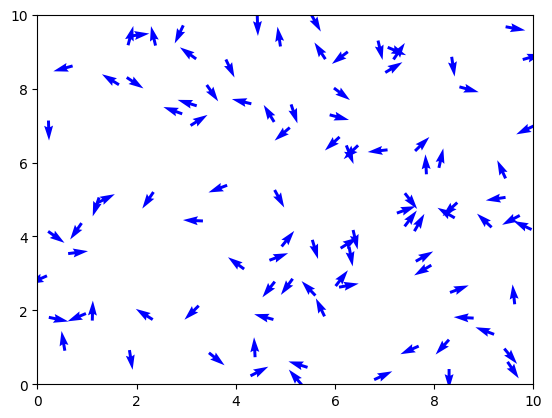

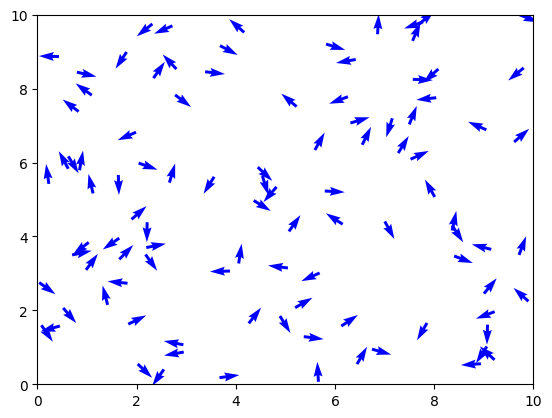

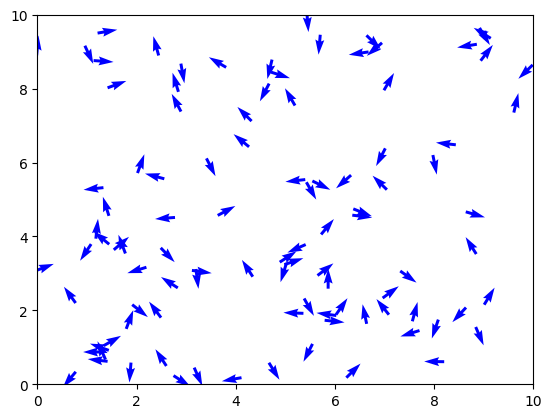

In [ ]:
ruido = np.arange(0, 1.05, 0.05)
resultados = []
for noise in ruido:
  print(noise)
  data_to_save = automatiacion_topo(noise)
  for fila in data_to_save:
      fila.insert(0, noise)
  resultados.extend(data_to_save)
df_topo = pd.DataFrame(resultados, columns=['noise', 'frame', 'particle_id', 'theta', 'x', 'y'])

In [ ]:
df_topo

,noise,frame,particle_id,theta,x,y
0,0.0,0,0,-0.247907,9.502096,1.673140
1,0.0,0,1,-1.360117,5.831857,2.663873
2,0.0,0,2,-1.387572,8.475773,6.028297
3,0.0,0,3,-0.711194,9.586744,5.663294
4,0.0,0,4,-2.627903,-0.013112,1.039848
...,...,...,...,...,...,...
1049995,1.0,4990,95,2.748574,5.678323,2.972063
1049996,1.0,4990,96,-1.508776,1.016634,4.672794
1049997,1.0,4990,97,1.787834,6.669772,3.242462
1049998,1.0,4990,98,-3.496897,4.772429,7.736029


In [ ]:
df_topo.to_csv('toda_la_simulacion_topo_neigh6_5000total.csv', index=False)

In [ ]:
print(df_topo[(df_topo['noise']== 0.2) & (df_topo['particle_id']==24)])

        noise  frame  particle_id     theta         x         y
200024    0.2      0           24  2.067947  6.825971  6.263773
200124    0.2     10           24  0.791826  9.276309  7.312344
200224    0.2     20           24  1.322669  4.514278  5.349016
200324    0.2     30           24  0.190013  3.949542  2.987019
200424    0.2     40           24  2.457190  7.191341  9.966258
...       ...    ...          ...       ...       ...       ...
249524    0.2   4950           24  2.657725  3.218642  6.891644
249624    0.2   4960           24  1.837087  7.613311  4.073139
249724    0.2   4970           24  1.757674  1.906161  1.006212
249824    0.2   4980           24  3.000312  6.254995  8.315272
249924    0.2   4990           24  1.982990  0.997137  6.030127

[500 rows x 6 columns]


        noise  frame  particle_id     theta          x         y
200024    0.2      0           24 -2.265578   1.061461  8.968647
200124    0.2     10           24  2.172275   2.601584  9.894187
200224    0.2     20           24  1.579660   8.331649  8.117687
200324    0.2     30           24  0.793881  10.385428  5.381019
200424    0.2     40           24  1.607186   9.034771  3.904453
...       ...    ...          ...       ...        ...       ...
249524    0.2   4950           24 -2.968381   6.182487  2.155378
249624    0.2   4960           24 -2.238164   7.542468  8.433074
249724    0.2   4970           24 -1.801158   2.776202  0.413807
249824    0.2   4980           24 -1.405627   9.964553  2.160011
249924    0.2   4990           24 -3.032883   5.595041  5.023256

[500 rows x 6 columns]


In [ ]:

ruido = np.arange(0, 1.05, 0.05)
x_lim = 10
resultados_order_parameter = []

for noise in ruido:
    # Filtrar el DataFrame por el nivel de ruido actual
    df_aux = df_topo[df_topo['noise'] == noise]
    df_noise = df_aux[df_aux['frame'] >= 4000]
    # Calcular el parámetro de orden para este nivel de ruido
    order_parameter_df = calculate_order_parameter(df_noise)
    order_parameter_df['order_parameter_al_cuadrado'] = order_parameter_df['order_parameter'] **2
    order_parameter_df['order_parameter_a_la_cuarta'] = order_parameter_df['order_parameter'] **4
    promedio_order_parameter = order_parameter_df['order_parameter'].mean()
    promedio_al_cuadrado_order_parameter = order_parameter_df['order_parameter_al_cuadrado'].mean()
    promedio_a_la_cuarta_order_parameter = order_parameter_df['order_parameter_a_la_cuarta'].mean()
    varianza = x_lim * x_lim * (promedio_al_cuadrado_order_parameter - promedio_order_parameter**2)
    binder = (1 - (promedio_a_la_cuarta_order_parameter)/(3*(promedio_al_cuadrado_order_parameter**2)))
    # Agregar los resultados a la lista
    resultados_order_parameter.append([noise, promedio_order_parameter,varianza,binder])

# Crear el DataFrame final
df_order_parameter_topo_5neigh_5000Tot = pd.DataFrame(resultados_order_parameter, columns=['noise', 'order_parameter','varianza','Binder'])

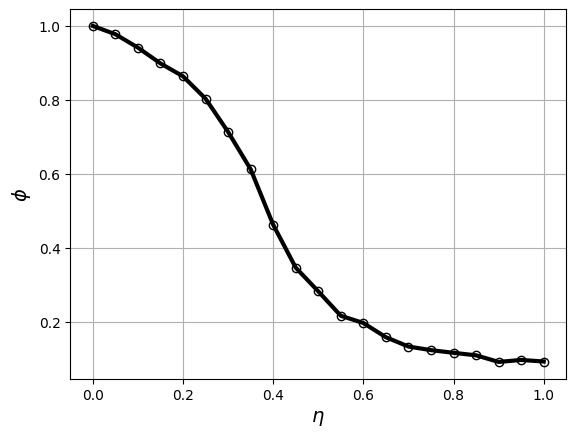

In [ ]:
# Crear la gráfica
plt.plot(df_order_parameter_topo_5neigh_5000Tot['noise'], df_order_parameter_topo_5neigh_5000Tot['order_parameter'],marker='o', linestyle='-',linewidth = 3,markerfacecolor='none',color='black')

# Añadir etiquetas y título
plt.xlabel('$\eta$',fontsize = 14)
plt.ylabel('$\phi$',fontsize = 14)
#plt.title('Relación entre Ruido y Parámetro de Orden')

# Mostrar la gráfica
plt.grid(True)
plt.show()

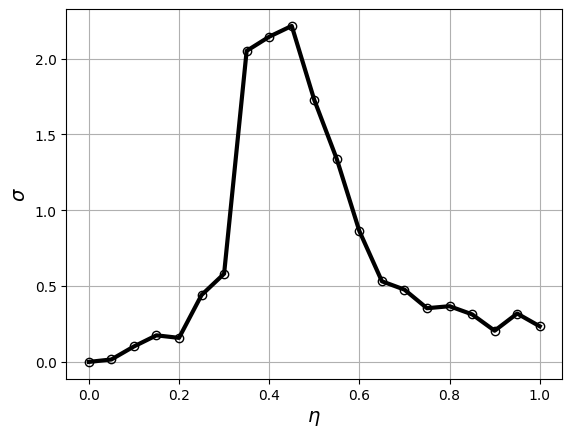

In [ ]:
# Crear la gráfica
plt.plot(df_order_parameter_topo_5neigh_5000Tot['noise'], df_order_parameter_topo_5neigh_5000Tot['varianza'],marker='o', linestyle='-',linewidth = 3,markerfacecolor='none', markeredgecolor='black',color='black')

# Añadir etiquetas y título
plt.xlabel('$\eta$',fontsize = 14)
plt.ylabel('$\sigma$',fontsize = 14)
#plt.title('Relación entre Ruido y Parámetro de Orden')

# Mostrar la gráfica
plt.grid(True)
plt.show()

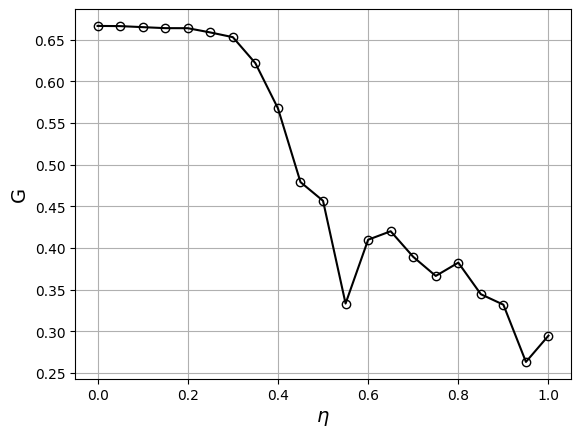

In [ ]:
# Crear la gráfica
plt.plot(df_order_parameter_topo_5neigh_5000Tot['noise'], df_order_parameter_topo_5neigh_5000Tot['Binder'],marker='o', linestyle='-',markerfacecolor='none', markeredgecolor='black',color='black')

# Añadir etiquetas y título
plt.xlabel('$\eta$',fontsize = 14)
plt.ylabel('G',fontsize = 14)
#plt.title('Relación entre Ruido y Binder')

# Mostrar la gráfica
plt.grid(True)
#x_lim = 0.7
#plt.xlim(0,x_lim)
plt.show()

Graficas de las tres simulaciones del modelo topologico

In [ ]:
df_topo_1 = pd.read_csv('toda_la_simulacion_topo_neigh4_5000total.csv')
df_topo_2 = pd.read_csv('toda_la_simulacion_topo_neigh5_5000total.csv')
df_topo_3 = pd.read_csv('toda_la_simulacion_topo_neigh6_5000total.csv')

In [ ]:
df_topo_1 = df_topo_1.sort_values(by=['frame', 'particle_id'])
df_topo_2 = df_topo_2.sort_values(by=['frame', 'particle_id'])
df_topo_3 = df_topo_3.sort_values(by=['frame', 'particle_id'])

In [ ]:
print(df_topo_1[(df_topo_1['noise']== 0.3) & (df_topo_1['particle_id']==24)])

        noise  frame  particle_id     theta         x         y
300024    0.3      0           24  2.048708  4.687884  9.946461
300124    0.3     10           24 -1.324052  1.487062  3.828917
300224    0.3     20           24  1.577025  3.673752  7.550020
300324    0.3     30           24  1.834226  1.448895  6.538355
300424    0.3     40           24  2.009738  0.072063  2.909227
...       ...    ...          ...       ...       ...       ...
349524    0.3   4950           24 -1.845641  0.822987  8.774776
349624    0.3   4960           24  2.111483  3.564555  6.110191
349724    0.3   4970           24  2.119179  7.740961  2.177921
349824    0.3   4980           24 -3.808493 -0.223517  6.025709
349924    0.3   4990           24  1.061726  2.141761  9.281921

[500 rows x 6 columns]


In [ ]:
df_topo_1_noise = df_topo_1['noise'].unique()
df_topo_2_noise = df_topo_2['noise'].unique()
df_topo_3_noise = df_topo_3['noise'].unique()

In [ ]:
df_topo_1_noise

array([0.  , 0.05, 0.1 , 0.15, 0.2 , 0.25, 0.3 , 0.35, 0.4 , 0.45, 0.5 ,
       0.55, 0.6 , 0.65, 0.7 , 0.75, 0.8 , 0.85, 0.9 , 0.95, 1.  ])

In [ ]:

ruido = np.arange(0, 1.05, 0.05)
x_lim = 10
resultados_order_parameter = []

for noise in df_topo_1_noise:
    # Filtrar el DataFrame por el nivel de ruido actual
    df_aux = df_topo_1[df_topo_1['noise'] == noise]
    df_noise = df_aux[df_aux['frame'] >= 3000]
    # Calcular el parámetro de orden para este nivel de ruido
    order_parameter_df = calculate_order_parameter(df_noise)
    order_parameter_df['order_parameter_al_cuadrado'] = order_parameter_df['order_parameter'] **2
    order_parameter_df['order_parameter_a_la_cuarta'] = order_parameter_df['order_parameter'] **4
    promedio_order_parameter = order_parameter_df['order_parameter'].mean()
    promedio_al_cuadrado_order_parameter = order_parameter_df['order_parameter_al_cuadrado'].mean()
    promedio_a_la_cuarta_order_parameter = order_parameter_df['order_parameter_a_la_cuarta'].mean()
    varianza = x_lim * x_lim * (promedio_al_cuadrado_order_parameter - promedio_order_parameter**2)
    binder = (1 - (promedio_a_la_cuarta_order_parameter)/(3*(promedio_al_cuadrado_order_parameter**2)))
    # Agregar los resultados a la lista
    resultados_order_parameter.append([noise, promedio_order_parameter,varianza,binder])

# Crear el DataFrame final
df_order_parameter_topo_4neigh_5000Tot = pd.DataFrame(resultados_order_parameter, columns=['noise', 'order_parameter','varianza','Binder'])

In [ ]:

ruido = np.arange(0, 1.05, 0.05)
x_lim = 10
resultados_order_parameter = []

for noise in df_topo_2_noise:
    # Filtrar el DataFrame por el nivel de ruido actual
    df_aux = df_topo_2[df_topo_2['noise'] == noise]
    df_noise = df_aux[df_aux['frame'] >= 3000]
    # Calcular el parámetro de orden para este nivel de ruido
    order_parameter_df = calculate_order_parameter(df_noise)
    order_parameter_df['order_parameter_al_cuadrado'] = order_parameter_df['order_parameter'] **2
    order_parameter_df['order_parameter_a_la_cuarta'] = order_parameter_df['order_parameter'] **4
    promedio_order_parameter = order_parameter_df['order_parameter'].mean()
    promedio_al_cuadrado_order_parameter = order_parameter_df['order_parameter_al_cuadrado'].mean()
    promedio_a_la_cuarta_order_parameter = order_parameter_df['order_parameter_a_la_cuarta'].mean()
    varianza = x_lim * x_lim * (promedio_al_cuadrado_order_parameter - promedio_order_parameter**2)
    binder = (1 - (promedio_a_la_cuarta_order_parameter)/(3*(promedio_al_cuadrado_order_parameter**2)))
    # Agregar los resultados a la lista
    resultados_order_parameter.append([noise, promedio_order_parameter,varianza,binder])

# Crear el DataFrame final
df_order_parameter_topo_5neigh_5000Tot = pd.DataFrame(resultados_order_parameter, columns=['noise', 'order_parameter','varianza','Binder'])

In [ ]:

ruido = np.arange(0, 1.05, 0.05)
x_lim = 10
resultados_order_parameter = []

for noise in df_topo_3_noise:
    # Filtrar el DataFrame por el nivel de ruido actual
    df_aux = df_topo_3[df_topo_3['noise'] == noise]
    df_noise = df_aux[df_aux['frame'] >= 3000]
    # Calcular el parámetro de orden para este nivel de ruido
    order_parameter_df = calculate_order_parameter(df_noise)
    order_parameter_df['order_parameter_al_cuadrado'] = order_parameter_df['order_parameter'] **2
    order_parameter_df['order_parameter_a_la_cuarta'] = order_parameter_df['order_parameter'] **4
    promedio_order_parameter = order_parameter_df['order_parameter'].mean()
    promedio_al_cuadrado_order_parameter = order_parameter_df['order_parameter_al_cuadrado'].mean()
    promedio_a_la_cuarta_order_parameter = order_parameter_df['order_parameter_a_la_cuarta'].mean()
    varianza = x_lim * x_lim * (promedio_al_cuadrado_order_parameter - promedio_order_parameter**2)
    binder = (1 - (promedio_a_la_cuarta_order_parameter)/(3*(promedio_al_cuadrado_order_parameter**2)))
    # Agregar los resultados a la lista
    resultados_order_parameter.append([noise, promedio_order_parameter,varianza,binder])

# Crear el DataFrame final
df_order_parameter_topo_6neigh_5000Tot = pd.DataFrame(resultados_order_parameter, columns=['noise', 'order_parameter','varianza','Binder'])

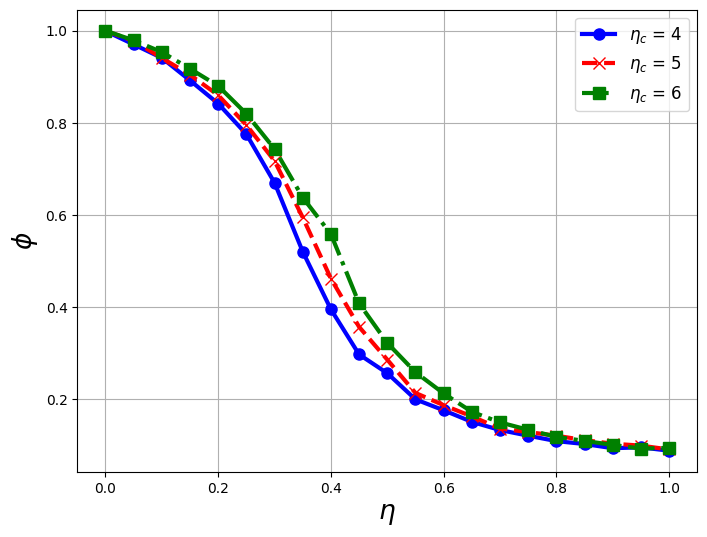

In [ ]:
# Create the plot
plt.figure(figsize=(8, 6))

# Plot each DataFrame's data
plt.plot(df_order_parameter_topo_4neigh_5000Tot['noise'], df_order_parameter_topo_4neigh_5000Tot['order_parameter'], marker='o',markersize = 8, linestyle='-', linewidth = 3,color= 'blue', label='$\eta_c$ = 4')
plt.plot(df_order_parameter_topo_5neigh_5000Tot['noise'], df_order_parameter_topo_5neigh_5000Tot['order_parameter'], marker='x',markersize = 8, linestyle='--',linewidth = 3, color= 'red', label='$\eta_c$ = 5')
plt.plot(df_order_parameter_topo_6neigh_5000Tot['noise'], df_order_parameter_topo_6neigh_5000Tot['order_parameter'], marker='s',markersize = 8, linestyle='-.',linewidth=3, color= 'green', label='$\eta_c$ = 6')

# Add labels and title
plt.xlabel('$\eta$',fontsize = 19)
plt.ylabel('$\phi$',fontsize = 19)
plt.legend(fontsize = 'large') # Show the legend to identify the lines

# Show the grid and plot
plt.grid(True)
plt.show()

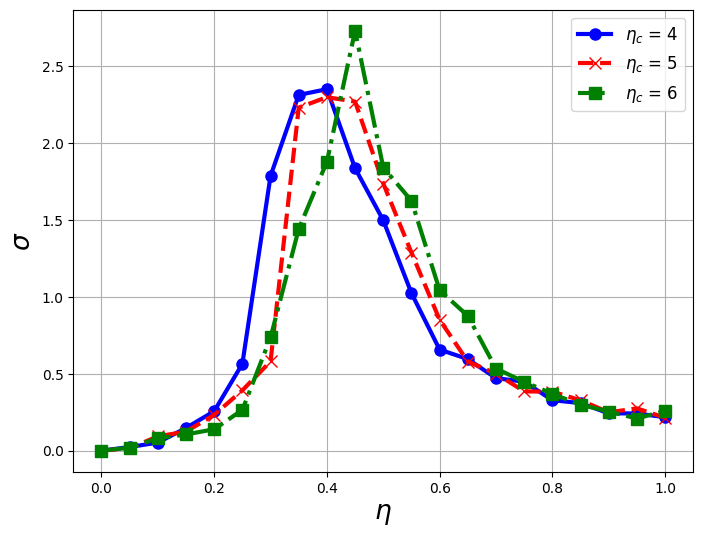

In [ ]:
# Create the plot
plt.figure(figsize=(8, 6))

# Plot each DataFrame's data
plt.plot(df_order_parameter_topo_4neigh_5000Tot['noise'], df_order_parameter_topo_4neigh_5000Tot['varianza'], marker='o',markersize = 8, linestyle='-',linewidth = 3, color= 'blue', label='$\eta_c$ = 4')
plt.plot(df_order_parameter_topo_5neigh_5000Tot['noise'], df_order_parameter_topo_5neigh_5000Tot['varianza'], marker='x',markersize = 8, linestyle='--',linewidth = 3, color= 'red', label='$\eta_c$ = 5')
plt.plot(df_order_parameter_topo_6neigh_5000Tot['noise'], df_order_parameter_topo_6neigh_5000Tot['varianza'], marker='s',markersize = 8, linestyle='-.',linewidth = 3, color= 'green', label='$\eta_c$ = 6')

# Add labels and title
plt.xlabel('$\eta$',fontsize = 19)
plt.ylabel('$\sigma$',fontsize = 19)
plt.legend(fontsize = 'large') # Show the legend to identify the lines

# Show the grid and plot
plt.grid(True)
plt.show()

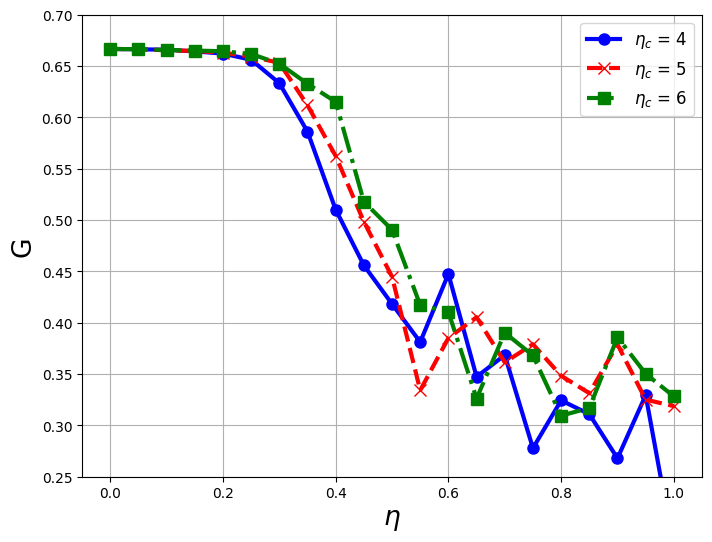

In [ ]:
# Create the plot
plt.figure(figsize=(8, 6))

# Plot each DataFrame's data
plt.plot(df_order_parameter_topo_4neigh_5000Tot['noise'], df_order_parameter_topo_4neigh_5000Tot['Binder'], marker='o',markersize = 8, linestyle='-',linewidth = 3, color= 'blue', label='$\eta_c$ = 4')
plt.plot(df_order_parameter_topo_5neigh_5000Tot['noise'], df_order_parameter_topo_5neigh_5000Tot['Binder'], marker='x',markersize = 8, linestyle='--',linewidth = 3, color= 'red', label='$\eta_c$ = 5')
plt.plot(df_order_parameter_topo_6neigh_5000Tot['noise'], df_order_parameter_topo_6neigh_5000Tot['Binder'], marker='s',markersize = 8, linestyle='-.',linewidth = 3, color= 'green', label='$\eta_c$ = 6')

# Add labels and title
plt.xlabel('$\eta$',fontsize = 19)
plt.ylabel('G',fontsize = 19)
plt.legend(fontsize = 'large') # Show the legend to identify the lines

# Show the grid and plot
plt.grid(True)
x_lim = 0.7
#plt.xlim(0,x_lim)
plt.ylim(0.25,0.7)
plt.show()